<center><span style="color:#27A3F5;font-size:26px;font-weight:700">Rent price prediction in Berlin</span></center>

<span style="color:#609926;font-size:20px;font-weight:500">Model explainability, model exploration and inference</span>

<span style="font-weight:500">
Load the model.
</span>

In [1]:
import joblib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.tree import plot_tree

In [2]:
import sys
import os

sys.path.append(os.path.abspath("../models"))

from rent_pipeline import (
    load_data,
    split_data,
    make_cv,
    evaluate_model,
    save_bundle,
    load_bundle,
    predict_listing,
    get_feature_names,
    build_preprocessor,
    build_pipeline
)

In [3]:
saved_model = joblib.load("../models/final_model.pkl")

In [4]:
pipeline = saved_model["pipeline"]
pipeline

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('preprocessor', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('floor', ...), ...]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'drop'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transfor

In [5]:
model = pipeline["model"]
model

,"n_estimators n_estimators: int, default=100The number of trees in the forest... versionchanged:: 0.22 The default value of ``n_estimators`` changed from 10 to 100 in 0.22.",200
,"criterion criterion: {""squared_error"", ""absolute_error"", ""friedman_mse"", ""poisson""}, default=""squared_error""The function to measure the quality of a split. Supported criteriaare ""squared_error"" for the mean squared error, which is equal tovariance reduction as feature selection criterion and minimizes the L2loss using the mean of each terminal node, ""friedman_mse"", which usesmean squared error with Friedman's improvement score for potentialsplits, ""absolute_error"" for the mean absolute error, which minimizesthe L1 loss using the median of each terminal node, and ""poisson"" whichuses reduction in Poisson deviance to find splits.Training using ""absolute_error"" is significantly slowerthan when using ""squared_error""... versionadded:: 0.18 Mean Absolute Error (MAE) criterion... versionadded:: 1.0 Poisson criterion.",'squared_error'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",40
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: {""sqrt"", ""log2"", None}, int or float, default=1.0The number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None or 1.0, then `max_features=n_features`... note:: The default of 1.0 is equivalent to bagged trees and more randomness can be achieved by setting smaller values, e.g. 0.3... versionchanged:: 1.1 The default of `max_features` changed from `""auto""` to 1.0.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",'sqrt'
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow trees with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsampl

<span style="color:#42b0f5;font-size:18px;font-weight:500">Part 1: Model exploration</span>

In [6]:
df = load_data('../datasets/rent_listings_final.csv')
X_train, X_test, y_train, y_test = split_data(df, test_size=0.2, random_state=16)

y_pred_test = pipeline.predict(X_test)

results_df = X_test.copy().reset_index(drop=True)
results_df["actual"] = y_test.values
results_df["predicted"] = y_pred_test
results_df["error"] = results_df["predicted"] - results_df["actual"]
results_df["abs_error"] = results_df["error"].abs()
results_df["pct_error"] = results_df["error"] / results_df["actual"] * 100
results_df.index.name = "listing_id"
results_df = results_df.reset_index()

hover_cols = ["listing_id", "area", "rooms", "district", "floor", "heating_type", "actual", "predicted", "error"]
results_df.head()

,listing_id,area,rooms,floor,year_built,has_balkon,has_terrasse,has_garten,elevator,parking,...,energy_source,heating_type,flooring_type,property_condition,free_from,actual,predicted,error,abs_error,pct_error
0,0,104.5,3.0,3.0,1905.0,False,False,False,False,False,...,Gas,Unknown,unknown,Well Maintained,immediately,1881.00,1950.107067,69.107067,69.107067,3.673954
1,1,62.0,2.0,1.0,NaN,False,False,False,False,False,...,Unknown,Central Heating,unknown,Unknown,unknown,536.99,633.505464,96.515464,96.515464,17.973419
2,2,61.0,2.0,NaN,NaN,True,False,False,False,False,...,Unknown,Central Heating,unknown,Unknown,not_immediately,1485.00,1466.758300,-18.241700,18.241700,-1.228397
3,3,73.0,1.5,2.0,2012.0,True,False,False,True,False,...,District Heating,Central Heating,unknown,Like New,immediately,1310.00,1339.370100,29.370100,29.370100,2.241992
4,4,131.2,3.0,1.0,2024.0,False,False,False,True,False,...,District Heating,Underfloor Heating,unknown,New / First Occupancy,immediately,1954.13,1941.971850,-12.158150,12.158150,-0.622177


In [7]:
results_df.shape

(3118, 26)

<span style="font-weight:500">
The dataframe (table) above contains the predictions, errors, absolute errors and errors in percentage (in addition to the rest of the features) for our testing set. 
<br />
It has 3118 tested samples. This will serve us to see how the model performed in detail, not just looking at the a few general metrics like R^2 and RMSE. 
</span>

In [8]:
fig_pva = px.scatter(results_df, x="actual", y="predicted", color="abs_error",
                      color_continuous_scale="RdYlGn_r", hover_data=hover_cols,
                      title="Predicted vs Actual cold rent (test set)")
m = max(results_df["actual"].max(), results_df["predicted"].max())
fig_pva.add_shape(type="line", x0=0, y0=0, x1=m, y1=m, line=dict(color="gray", dash="dash"))
fig_pva.show()

<span style="font-weight:500">
The scatter plot above shows the relation between the actual and predicted values. The model seems to be doing very good, with very few outliers, specifically the one with id 2811 with a huge error of 2261. We can notice that for small values (under 800) the model seems to overpredict and for large values the model seems to underpredict. Especially for very large values, which are all below the line meaning that the model will always underpredict for apartments with rent more than 3500 euros.
</span>

In [9]:
def predict_with_uncertainty(pipeline, X):
    preprocessor = pipeline.named_steps["preprocessor"]
    forest = pipeline.named_steps["model"]
    X_proc = preprocessor.transform(X)
    tree_preds = np.stack([t.predict(X_proc) for t in forest.estimators_], axis=1)  
    return tree_preds.mean(axis=1), tree_preds.std(axis=1), tree_preds

pred_mean, pred_std, tree_preds = predict_with_uncertainty(pipeline, X_test)
results_df["pred_std"] = pred_std
results_df["pred_p10"] = np.percentile(tree_preds, 10, axis=1)
results_df["pred_p90"] = np.percentile(tree_preds, 90, axis=1)

fig_unc = px.scatter(results_df.sort_values("predicted"), x="predicted", y="actual",
                      error_y=results_df.sort_values("predicted")["pred_std"],
                      hover_data=hover_cols + ["pred_std"], title="Predictions with ±1 std uncertainty band")
fig_unc.show()

print("corr(pred_std, abs_error):", np.corrcoef(results_df["pred_std"], results_df["abs_error"])[0, 1])

corr(pred_std, abs_error): 0.536404140615504


<span style="font-weight:500">
The graph above, similar to the previous one, shows the points, using the same variables, but this time using uncertainty to encode the size of segments. 
<br />
We notice that there is a correlation between the rent price and uncertainty, that could be because we had a right-skewerd distribution of apartment prices and outliers tend to have a higher uncertainty, hence the very expensive apartments having the highest level of uncertainty.
</span>

<span style="font-weight:500">
A correlation of 0.536 indicates a moderate-to-strong positive relationship between tree disagreement (pred_std) and actual prediction error (abs_error).

Our Random Forest knows when it doesn't know. When the individual trees in the ensemble disagree strongly on a property's rent, the final averaged prediction is much more likely to be wrong.

This is very useful because we don't want to show the user a single value for each prediction but rather use it to communicate whether the user can trust the prediction or not.
</span>

In [10]:
fig_resid = px.scatter(results_df, x="predicted", y="error", color="abs_error",
                        color_continuous_scale="RdYlGn_r", hover_data=hover_cols,
                        title="Residuals vs predicted value")
fig_resid.add_hline(y=0, line_dash="dash", line_color="gray")
fig_resid.show()

<span style="font-weight:500">
The graph above shows the relation between residuals and predicted values. Most of the values are concentrated around 0 and the outliers here are between predicted values of 1000 and 3000. This shows that the models tend to squeeze the very large values into this range, hence being the reason for the very large absolute errors.
</span>

In [11]:
fig_hist = px.histogram(results_df, x="error", nbins=40, marginal="box", title="Distribution of residuals")
fig_hist.add_vline(x=0, line_dash="dash", line_color="gray")
fig_hist.show()

<span style="font-weight:500">
The histogram and box plot show the distribution of errors. As expected from any good-performing model, they are centered around 0 and on top of that they have a healthy normal distribution.
</span>

In [12]:
def plot_tree_vote_distribution(row_idx):
    row = results_df.iloc[row_idx]
    votes = tree_preds[row_idx]
    fig = px.histogram(x=votes, nbins=30,
                        title=f"Listing #{int(row['listing_id'])}: {len(votes)} individual tree predictions")
    fig.add_vline(x=votes.mean(), line_color="blue", annotation_text="forest mean")
    fig.add_vline(x=row["actual"], line_color="green", annotation_text="actual")
    fig.update_layout(xaxis_title="Predicted rent (€) per tree", yaxis_title="# trees")
    return fig

plot_tree_vote_distribution(0).show()

In [13]:
results_df.head(1)

,listing_id,area,rooms,floor,year_built,has_balkon,has_terrasse,has_garten,elevator,parking,...,property_condition,free_from,actual,predicted,error,abs_error,pct_error,pred_std,pred_p10,pred_p90
0,0,104.5,3.0,3.0,1905.0,False,False,False,False,False,...,Well Maintained,immediately,1881.0,1950.107067,69.107067,69.107067,3.673954,507.128988,1500.0,2567.0


<span style="font-weight:500">
Our Random Forest works in a way that out of n number of trees, each individual tree makes its own prediction and the final prediction is obtained by aggregating the predictions of all trees, hence the reason RandomForest is an ensemble model. We trained our Random Forest with 200 estimators, meaning that each observation receives 200 individual predictions, one from each tree.
<br />
The graph above shows us the breakdown of one of the predictions. The bar chart has grouped the predictions into ranges and shows how many trees' predictions are contained in that range. The graph initially suggests a relatively high degree of variation among the individual tree predictions, as the predictions range from 0 to 3200 euros, but most of the trees, precisely 113 trees, are in the correct range. Also, the absolute error is only 69 euros for a price of 1881. That is an error of 3.1% which makes it a very accurate prediction.
</span>

In [14]:
worst = results_df.sort_values("abs_error", ascending=False).head(15)
worst[["listing_id","area","rooms","district","floor","heating_type","actual","predicted","error","pct_error","pred_std"]].round(1)

,listing_id,area,rooms,district,floor,heating_type,actual,predicted,error,pct_error,pred_std
2811,2811,150.0,3.0,Friedrichshain,4.0,Central Heating,3600.0,1338.1,-2261.9,-62.8,521.0
2245,2245,485.0,6.0,Französisch Buchholz,4.0,Underfloor Heating,4334.0,2664.8,-1669.2,-38.5,831.6
770,770,751.0,7.0,Kladow,0.0,Underfloor Heating,4500.0,2878.2,-1621.8,-36.0,992.0
1729,1729,88.0,3.0,Friedrichshain,1.0,Underfloor Heating,3000.0,1594.5,-1405.5,-46.8,498.5
202,202,116.4,4.0,Prenzlauer Berg,1.0,Underfloor Heating,3600.0,2308.4,-1291.6,-35.9,481.9
931,931,102.4,4.0,Prenzlauer Berg,1.0,Central Heating,3237.6,1967.6,-1270.1,-39.2,666.3
539,539,129.0,5.0,Prenzlauer Berg,NaN,Central Heating,2660.0,1506.2,-1153.8,-43.4,500.6
989,989,203.0,5.0,Mitte,3.0,Central Heating,4750.0,3619.1,-1130.9,-23.8,1275.5
1896,1896,85.0,2.5,Wilmersdorf,1.0,Underfloor Heating,2750.0,1654.3,-1095.7,-39.8,506.6
2967,2967,56.0,2.0,Wilmersdorf,0.0,Unknown,2200.0,1149.7,-1050.3,-47.7,586.7


<span style="font-weight:500">
Among the 15 observations with the highest absolute errors, Prenzlauer Berg is the most frequently occurring district, appearing five times and we also notice that almost all the apartments have originally expensive rents and low estimated rents, leading to large absolute errors. As we stated before, this suggests a systematic underprediction among the largest errors, rather than simply random errors.
<br />
An exception would be sample number 792 and 564 in Friedrichshain and Neukölln with underpredictions of around 950 euros. This large difference may indicate that the apartment is unusually inexpensive relative to apartments with similar characteristics in the dataset, making it an attractive offer.
</span>

In [15]:
worst = results_df.sort_values("pct_error", ascending=False).head(15)
worst[["listing_id","area","rooms","district","floor","heating_type","actual","predicted","error","pct_error","pred_std"]].round(1)

,listing_id,area,rooms,district,floor,heating_type,actual,predicted,error,pct_error,pred_std
2692,2692,28.4,1.0,Marienfelde,3.0,Central Heating,198.0,810.1,612.1,309.1,312.6
1815,1815,32.0,1.0,Charlottenburg,0.0,Unknown,120.0,412.0,292.0,243.4,85.1
1029,1029,93.0,1.0,Köpenick,3.0,Unknown,360.0,1168.7,808.7,224.6,966.0
1368,1368,25.0,1.0,Grünau,0.0,Unknown,170.0,537.9,367.9,216.4,265.0
3080,3080,40.0,1.0,Hellersdorf,NaN,Central Heating,269.0,800.1,531.1,197.4,398.5
221,221,48.0,2.0,Friedrichshain,6.0,Underfloor Heating,325.0,951.4,626.4,192.7,505.8
1331,1331,40.0,1.0,Hellersdorf,1.0,Central Heating,269.0,755.7,486.7,180.9,396.0
2128,2128,87.0,3.0,Schöneberg,2.0,Unknown,250.0,690.1,440.1,176.0,343.6
1801,1801,42.0,1.0,Staaken,5.0,Underfloor Heating,294.0,806.6,512.6,174.4,341.8
481,481,36.8,1.0,Prenzlauer Berg,3.0,Unknown,273.3,735.4,462.1,169.1,334.6


<span style="font-weight:500">
Among the 15 observations with the highest relative errors (errors in percentage), there is no clear pattern among features, but there is a clear pattern among prices. Unlike absolute errors caused by underpredicting very expensive apartments, here the errors are caused by overpredicting very affordable apartments. This clearly suggests a systematic underprediction among the largest errors, rather than simply random errors.
<br />
This is a good sign considering that most of these are very rare cases and it is unlikely to encounter users having these kinds of apartments, making our model even better for inference than currently estimated. 
</span>

In [16]:
def group_metrics(results_df, group_col, min_count=5):
    rows = []
    for g, sub in results_df.groupby(group_col):
        if len(sub) < min_count:
            continue
        rows.append({
            group_col: g, "n": len(sub),
            "MAE": mean_absolute_error(sub["actual"], sub["predicted"]),
            "RMSE": np.sqrt(mean_squared_error(sub["actual"], sub["predicted"])),
            "R2": r2_score(sub["actual"], sub["predicted"]) if len(sub) > 1 else np.nan,
            "bias": sub["error"].mean(),
        })
    return pd.DataFrame(rows).sort_values("MAE", ascending=False)

district_metrics = group_metrics(results_df, "district")
district_metrics.round(1)

px.bar(district_metrics, x="district", y="MAE", color="bias", color_continuous_scale="RdBu_r",
       hover_data=["n", "RMSE", "R2"], title="Error by district").show()

fig_box = px.box(results_df, x="district", y="error", points="all", title="Residual distribution by district")
fig_box.add_hline(y=0, line_dash="dash", line_color="gray")
fig_box.show()

<span style="font-weight:500">
The first graph shows districts associated with the highest RMSE errors. Surpisingly, there is not a very strong correlation between sample size and error. The leading districts seem to be both districts with small samples as well as with large samples, with districts with small samples appearing slightly more frequently in the leading positions.  
<br />
Französisch Buchholz leads the graph, followed by Kladow with the strongest underprediction. Very few districts seem to be associated with underpredicting bias, such as Prenzlauer Berg, Wannsee and Friedrichshagen while there are many districts associated with significant overpredicting bias, with the strongest bias being Hermsdorf, Marienfelde, Marzahn and Altglineicke. 
<br />
<br />
When it comes to the districts with the widest residual distribution, most of them seem to correspond to the districts with the highest overall errors and big error outliers, like Prenzlauer Berg, Friedrichshain, Charlottenburg, Mitte, Wilmersdorf and Weißensee.    
</span>

In [17]:
for col in ["property_condition", "heating_type", "rooms"]:
    display(group_metrics(results_df, col, min_count=3).round(1))

,property_condition,n,MAE,RMSE,R2,bias
3,Old Building,15,148.6,274.5,1.0,-20.6
6,Renovated,271,141.8,231.1,0.9,-14.9
7,Unknown,1837,136.2,212.3,0.9,12.3
5,Partially Renovated,5,122.9,176.5,0.5,-48.4
0,Like New,322,119.7,216.1,0.9,-19.9
2,New / First Occupancy,370,95.8,166.9,0.9,-2.7
8,Well Maintained,288,79.3,150.0,0.9,25.0
4,Other,5,77.4,144.7,1.0,-56.5
1,Needs Renovation,5,45.0,61.6,1.0,45.0


,heating_type,n,MAE,RMSE,R2,bias
4,Unknown,1322,146.6,214.0,0.9,5.8
0,Central Heating,900,123.7,216.6,0.9,10.7
3,Unit Heating,157,96.0,164.4,0.9,25.6
2,Underfloor Heating,674,94.1,181.8,0.9,-3.1
1,Individual,65,82.8,138.5,1.0,-23.4


,rooms,n,MAE,RMSE,R2,bias
9,6.0,8,419.0,673.2,0.7,-189.7
7,4.5,12,222.0,289.8,0.8,-113.8
8,5.0,76,211.2,334.6,0.9,-24.2
6,4.0,314,145.5,244.4,0.9,-12.7
4,3.0,791,145.1,233.4,0.9,-5.7
5,3.5,28,117.7,205.7,0.7,-14.0
3,2.5,103,117.1,191.4,0.9,5.8
2,2.0,1197,113.8,173.7,0.9,10.8
0,1.0,536,91.5,144.6,0.9,36.3
1,1.5,49,74.9,101.9,1.0,10.0


<span style="font-weight:500">
Property condition:
</span>
<br />
Most of them seem to have a very good R^2 except 'Partially Renovated', that means that our model is not good at explaining the variance of this category. One possible reason is that partially renovated properties can differ substantially in their actual condition, making the category less homogeneous. In terms of RMSE, most categories show errors of roughly €200, while Other and Needs Renovation have lower errors. However, the lower RMSE in these categories should be interpreted carefully, as it may partly result from their smaller number of observations or lower variability in rent. 'New / First Occupancy' has an almost negligible bias of −€2.7, indicating that the model is, on average, neither substantially overestimating nor underestimating rents for this category.
<br />
<br />
<span style="font-weight:500">
Heating type:
</span>
<br />
The performance of the model is relatively consistent across heating types, with similar R² and RMSE values. This suggests that heating type itself does not strongly determine how accurately the model predicts rent. Bias is making the whole difference, with categories like 'Unit Heating' and 'Individual' having much higher bias than the rest, indicating that the model tends to systematically overestimate or underestimate rents for these properties. This could suggest that the effect of these heating systems is not fully captured by the model, potentially because these categories interact with other characteristics such as building age, property condition, or energy efficiency.
<br />
<br />
<span style="font-weight:500">
Number of rooms:
</span>
<br />
A clear relationship can be observed between the number of rooms and prediction error. Apartments with a higher number of rooms, like 4 to 6 rooms, tend to have a much larger RMSE and bias. This could be due to the fact that most of the outliers were apartments that were with very large areas and a number of rooms. 


<span style="color:#42b0f5;font-size:18px;font-weight:500">Part 2: Modeling interpretation and explainablity</span>

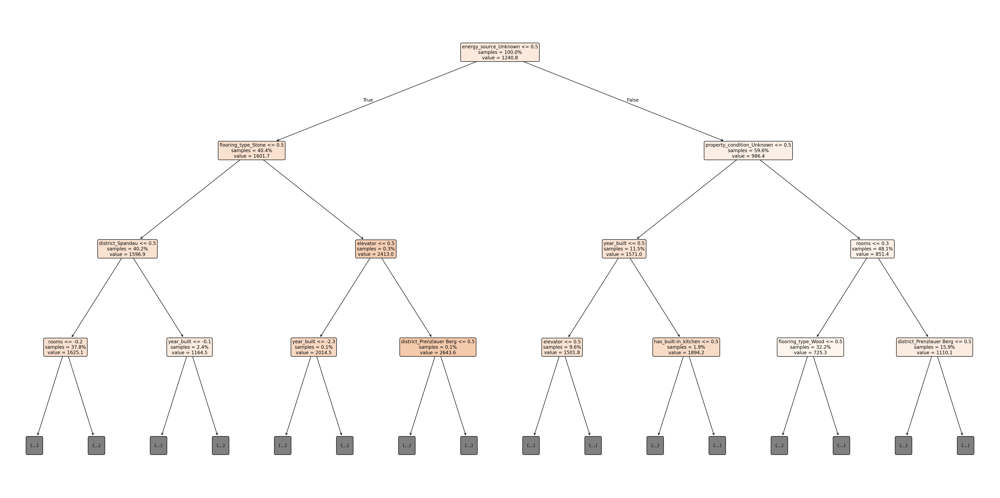

In [18]:
feature_names = get_feature_names(pipeline)

plt.figure(figsize=(30, 15), dpi = 200)
plot_tree(
    model.estimators_[0], # show the 1st out of the random trees in the random forest
    feature_names=feature_names,
    filled=True,
    rounded=True,
    max_depth=3,       
    fontsize=10,     
    precision=1,      
    impurity=False,      
    proportion=True
)
plt.tight_layout()
plt.show()

<span style="font-weight:500">
While a couple of things might seem confusing, like values of thresholds for each split due to standardization or the name of the features used due to encoding, the interpretation of the image becomes unclear. The purpose of this visualization is just to create an idea of how the Random Forest is operating by selecting the best features from a random set of features for each split and computing the best thresholds to minimize the loss. </span>

                                     feature  importance
0                                       area    0.266359
1                                      rooms    0.141018
91                         free_from_unknown    0.059999
3                                 year_built    0.059354
87                property_condition_Unknown    0.044961
89                     free_from_immediately    0.039626
67                     energy_source_Unknown    0.038840
2                                      floor    0.024814
36                            district_Mitte    0.022632
70           heating_type_Underfloor Heating    0.021438
60            energy_source_District Heating    0.018024
6                                 has_shower    0.016725
5                       has_built-in_kitchen    0.016428
4                                   elevator    0.015819
82  property_condition_New / First Occupancy    0.010331
78                        flooring_type_Wood    0.009973
90                 free_from_no

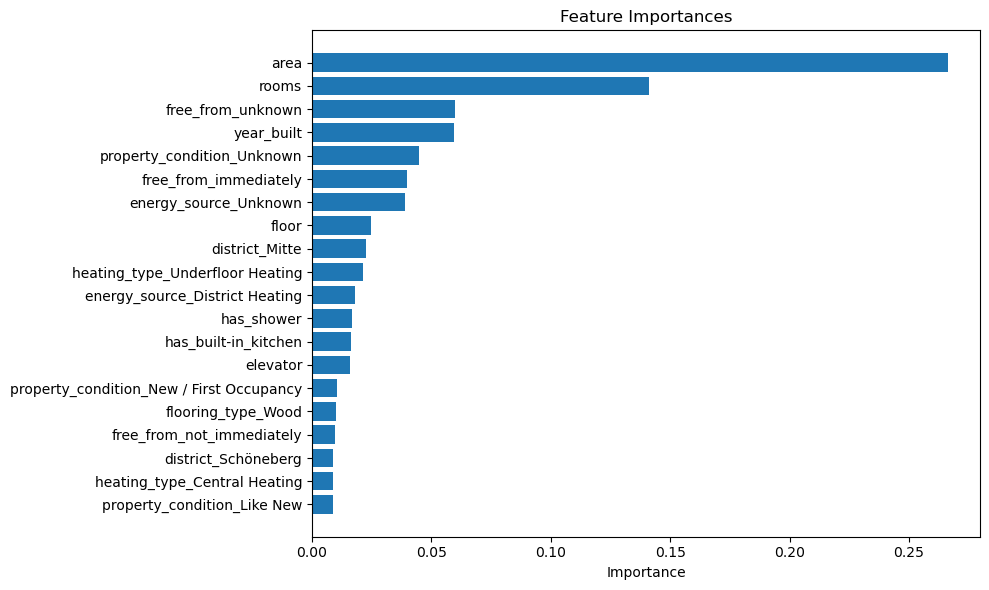

In [19]:
importances = pipeline.named_steps["model"].feature_importances_

fi_df = pd.DataFrame({"feature": feature_names, "importance": importances})
fi_df = fi_df.sort_values("importance", ascending=False)

print(fi_df[:20])

plt.figure(figsize=(10, 6))
plt.barh(fi_df["feature"][:20], fi_df["importance"][:20])
plt.gca().invert_yaxis()
plt.title("Feature Importances")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

<span style="font-weight:500">
The graph shows the importance of the features. As we also noticed during Exploratory Data Analysis, the features with the highest importance correspond to the features we concluded had the highest impact, with area having a high importance of 26.6%, followed by the number of rooms and then the availability of the apartment. By observing this graph, we can gain additional information other than the one we discovered in EDA. For example, we have 'free_from_unknown' as our 3rd feature, with a very relatively high importance. 
<br>
What we notice here is that many unknown categories show up as the top 15 most important features. These could be due to the fact that some of them had high occurrences from 35% to 65% depending on the feature. During EDA we noticed that some of these categories had a really strong meaning and impact on the price, for example "free_from_unknown" making it to the top 3 here, was associated with a huge negative impact on the price.
<br>
One specific category, "Miete" being the 9th most important with 2.2% importance, shows cleaning and working with difficult features like location really pays off and can help with modeling for difficult problems. 
</span>

In [20]:
import matplotlib.pyplot as plt
import shap
import ipywidgets as widgets
from IPython.display import display, clear_output

feature_names = get_feature_names(pipeline)
explainer = shap.TreeExplainer(model)
preprocessor = pipeline.named_steps["preprocessor"]

def explain_listing(row_idx):
    row = results_df.iloc[row_idx]

    print(f"Property #{int(row['listing_id'])}")
    print(f"Actual:     €{row['actual']:.0f}")
    print(f"Predicted:  €{row['predicted']:.0f}")
    print(f"Error:      €{row['error']:+.0f}  ({row['pct_error']:+.1f}%)")
    print(f"Confidence: ±€{row['pred_std']:.0f} (std across {len(model.estimators_)} trees)\n")

    for col in ["area", "rooms", "district", "floor", "heating_type", "property_condition", "year_built"]:
        print(f"{col:>20s}: {row[col]}")

    display(plot_tree_vote_distribution(row_idx))

    X_row = X_test.iloc[[row_idx]]
    X_row_processed = preprocessor.transform(X_row)
    if hasattr(X_row_processed, "toarray"):
        X_row_processed = X_row_processed.toarray()

    shap_row = explainer(X_row_processed)

    exp = shap.Explanation(
        values=shap_row.values[0],
        base_values=shap_row.base_values[0],
        data=X_row_processed[0],
        feature_names=feature_names
    )

    plt.close('all')
    shap.plots.waterfall(exp, show=False)
    plt.show()

output = widgets.Output()

def on_click(trace, points, state):
    with output:
        clear_output(wait=True)
        if points.point_inds:
            try:
                explain_listing(points.point_inds[0])
            except Exception as e:
                print(f"Error generating explanation: {e}")

hover_df = results_df.copy()
hover_df[["floor", "year_built"]] = hover_df[["floor", "year_built"]].fillna(-1)

fig_pva_widget = px.scatter(
    hover_df, x="actual", y="predicted", color="abs_error",
    color_continuous_scale="RdYlGn_r", hover_data=hover_cols,
    title="Predicted vs Actual cold rent (test set)"
)

fw = go.FigureWidget(fig_pva_widget)
fw.data[0].on_click(on_click)
display(fw, output)

FigureWidget({
    'data': [{'customdata': array([[0, 104.5, 3.0, ..., 3.0, 'Unknown', 69.1070666666667],
                                   [1, 62.0, 2.0, ..., 1.0, 'Central Heating', 96.51546351320462],
                                   [2, 61.0, 2.0, ..., -1.0, 'Central Heating', -18.24169999999981],
                                   ...,
                                   [3115, 36.0, 1.0, ..., 4.0, 'Unknown', -114.10078762749845],
                                   [3116, 98.0, 4.0, ..., 2.0, 'Underfloor Heating', 54.330284090909345],
                                   [3117, 85.0, 3.5, ..., 4.0, 'Central Heating', 146.05516666666665]],
                                  shape=(3118, 7), dtype=object),
              'hovertemplate': ('actual=%{x}<br>predicted=%{y}<' ... '%{marker.color}<extra></extra>'),
              'legendgroup': '',
              'marker': {'color': array([ 69.10706667,  96.51546351,  18.2417    , ..., 114.10078763,
                                          5

Output()

<span style="font-weight:500">
The scatterplot above is the same one as the one we had above, but with an added interactive functionality. We can inspect each point to see its prediction breakdown. For example, we are inspecting property number 27, which has a very accurate prediction of 1909 from the original value of 1920. 
<br />
The second graph shows the breakdown of each prediction from each tree estimator of the Random Forest. Around 75% of the trees have predicted a value around the correct range. 
<br />
The third graph shows the SHAP explanation of this particular prediction. In order to understand this graph, we have to start reading it from the bottom. We start with the expected value of the model’s predictions, which is €1237.195. This represents the average predicted rent across all observations, before taking into consideration specific features of a particular apartment.
<br />
Each feature then contributes to shifting this baseline up or down. The least significant features, 83 features and their effect in total decreases the predicted rent by €151.72. Not having a built-in kitchen and having an unknown property condition seems to affect the price negatively. Having floor heating and having an immediate moving date it increases the price by a lot. What we notice here is that the move-in feature affacts the price significantly twice. The feature with the strongest positive contribution is area, an area of 117.7 m^2 (read from the values printed - not from the encoded and scaled values of the SHAP graph) increases the predicted rent by €436.04. The second most influential feature is the number of rooms, having 4 rooms increases the prediction value by €227.35. Surprisingly, energy source unknown in this case seem to increase the value. In total, the feature shifts the predicted value from €1237.195 to €1917.624.
<br />
</span>

In [21]:
import shap

model = pipeline.named_steps["model"]
X_test_processed = pipeline.named_steps["preprocessor"].transform(X_test)
feature_names = get_feature_names(pipeline)

explainer = shap.TreeExplainer(model)
sample_idx = np.random.RandomState(16).choice(X_test_processed.shape[0], size=100, replace=False)
shap_values = explainer(X_test_processed[sample_idx], check_additivity=False)
explanation = shap.Explanation(
    values=shap_values.values,
    base_values=shap_values.base_values,
    data=X_test_processed[sample_idx],
    feature_names=feature_names
)

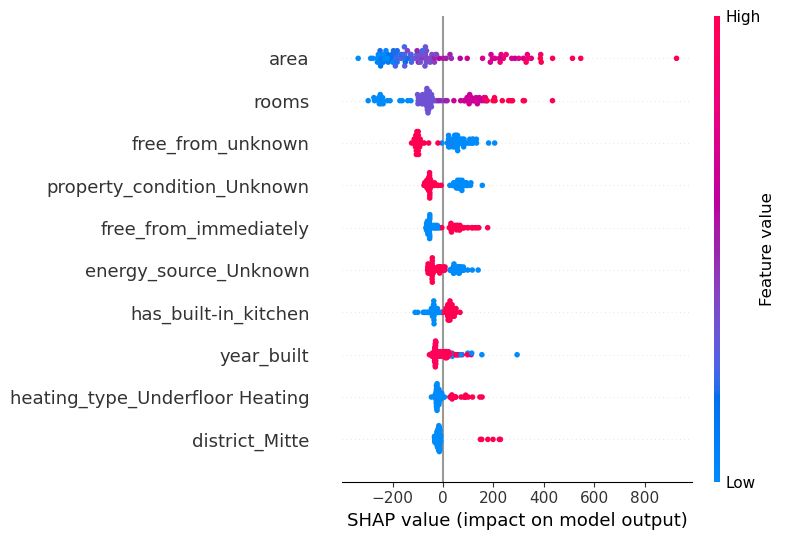

In [22]:
import warnings
warnings.filterwarnings("ignore")
shap.summary_plot(explanation, max_display=10)

<span style="font-weight:500">
This SHAP chart is like a kind of scatterplot that shows how each feature impacts the predictions. Area and number of rooms seem to be strongly positively correlated with the price. When an apartment is immediately available to move in, then that would be translated into a higher price. The opposite case would be when the apartment move-in date is not known. Energy source and propery condition features being unknown would cause a negative effect on the prices. When it comes to the feature corresponding to the year that the apartment is built, its effect is somewhat confusing, with high and low values overlapping. Also having a kitchen and underfloor heating has a clear positive relation to the price. Being located in the district 'Mitte' has a very strong and clear association with higher prices. 
</span>

In [23]:
importances = model.feature_importances_

fi_df = (
    pd.DataFrame({"feature": feature_names, "importance": importances})
    .sort_values("importance", ascending=False)
)

print(fi_df.head(10))

                            feature  importance
0                              area    0.266359
1                             rooms    0.141018
91                free_from_unknown    0.059999
3                        year_built    0.059354
87       property_condition_Unknown    0.044961
89            free_from_immediately    0.039626
67            energy_source_Unknown    0.038840
2                             floor    0.024814
36                   district_Mitte    0.022632
70  heating_type_Underfloor Heating    0.021438


<span style="font-weight:500">
The importance ranking for our final model is almost identical to our SHAP values. Their role is not for economic interpretation, but in our case they seem to have done a great job explaining what drives the rental prices the most in this market.
</span>

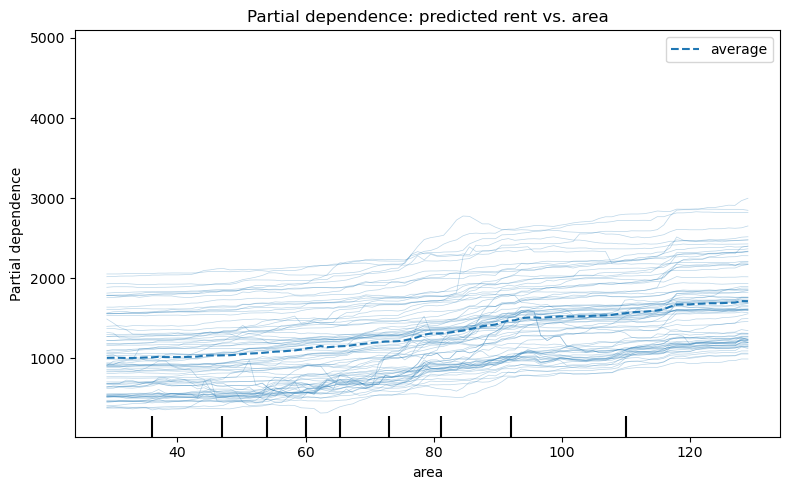

In [24]:
from sklearn.inspection import PartialDependenceDisplay

fig, ax = plt.subplots(figsize=(8, 5))
PartialDependenceDisplay.from_estimator(pipeline, X_train, features=["area"], kind="both",
                                         ax=ax, subsample=80, random_state=16)
plt.title("Partial dependence: predicted rent vs. area")
plt.tight_layout()
plt.show()

<span style="font-weight:500">

**Property Area** 

The partial dependence plot shows an overall gradual increase in predicted cold rent as property area increases. This indicates that larger properties tend to be associated with higher predicted rents.

The relationship is relatively stable across most of the observed area range, but some sections show greater variability. For properties with predicted rents below €1,000, the model response is more noisy for approximately **45–70 m²**, while predictions outside this range appear comparatively steady. For predicted rents above €1,000, greater variability can be observed around **70–100 m²**.

This variation may reflect the influence of other property characteristics that interact with area, such as location, number of rooms, property condition, or floor. Apartments of a similar size can therefore receive substantially different rent predictions depending on their other features. The increased variability in the mid-sized ranges may also indicate that these apartment sizes are represented by a more diverse mix of properties in the dataset.
</span>

In [25]:
def partial_dependence_curve(pipeline, X_ref, feature, n_points=30):
    grid = np.linspace(X_ref[feature].quantile(0.02), X_ref[feature].quantile(0.98), n_points)
    rows = []
    for val in grid:
        X_mod = X_ref.copy()
        X_mod[feature] = val
        mean_p, std_p, _ = predict_with_uncertainty(pipeline, X_mod)
        rows.append({feature: val, "predicted_mean": mean_p.mean(), "tree_std_mean": std_p.mean()})
    return pd.DataFrame(rows)

pdp_area = partial_dependence_curve(pipeline, X_train, "area")
fig_pdp = go.Figure(go.Scatter(x=pdp_area["area"], y=pdp_area["predicted_mean"], mode="lines+markers"))
fig_pdp.update_layout(title="What happens as apartment size increases?",
                       xaxis_title="Area (m²)", yaxis_title="Predicted cold rent (€)")
fig_pdp.show()

<span style="color:#42b0f5;font-size:18px;font-weight:500">Part 3: Inference</span>

<span style="font-weight:500">
Test a prediction using unseen data, simulating how a user would interact with the model in production.

We evaluated a new rental listing posted on 03/03/2026 with the following characteristics:

Cold rent: 1,990 euro

Apartment size: 83.3 m²

Number of rooms: 4

Floor: 1st floor

Availability: immediately

District: Friedrichsfelde, Berlin

Amenities: built-in kitchen, bathtub, and shower

Construction year: 2025

Additional features: a balcony, terrace, garden, parking, and basement were absent, while an elevator and barrier-free access were available.
</span>

In [26]:
from rent_pipeline import validate_listing

def predict_with_confidence(raw_listing, bundle, explainer=None, feature_names=None):
    pipeline = bundle["pipeline"]
    new_data = validate_listing(raw_listing, bundle)   # checks required fields, fills nullable ones (floor/year_built)

    mean_p, std_p, tree_preds_row = predict_with_uncertainty(pipeline, new_data)
    point_pred = pipeline.predict(new_data)[0]
    p10, p90 = np.percentile(tree_preds_row[0], [10, 90])

    point_pred = float(pipeline.predict(new_data)[0])
    std = float(std_p[0])
    p10, p90 = map(float, np.percentile(tree_preds_row[0], [10, 90]))
    
    print(f"Predicted cold rent: €{point_pred:.0f}")
    print(f"Confidence (±1 std): €{std:.0f}  ->  ~68% range: €{point_pred - std:.0f} - €{point_pred + std:.0f}")
    print(f"80% interval (tree p10-p90): €{p10:.0f} - €{p90:.0f}")

    fig = px.histogram(x=tree_preds_row[0], nbins=30,
                        title=f"{len(tree_preds_row[0])} individual tree predictions for this listing")
    fig.add_vline(x=point_pred, line_color="blue", annotation_text="forest mean (prediction)")
    fig.show()

    if explainer is not None:
        new_data_processed = pipeline.named_steps["preprocessor"].transform(new_data)
        shap_row = explainer(new_data_processed)
        exp = shap.Explanation(values=shap_row.values[0], base_values=shap_row.base_values[0],
                                data=new_data_processed[0], feature_names=feature_names)
        shap.plots.waterfall(exp)

    return point_pred, float(std_p[0]), (p10, p90)

In [27]:
raw_listing_1 = {
    "area": 83.3,
    "rooms": 4,
    "floor": 1,
    "free_from": "immediately",
    # "has_balkon": True,
    # "has_terrasse": False,
    # "has_garten": False,
    "elevator": True,
    # "parking": False,
    # "has_basement": False,
    # "is_barrier-free": True,
    "has_built-in_kitchen": True,
    # "has_bathtub": True,
    "has_shower": True,
    "flooring_type": "Wood",
    "energy_source": "District Heating",
    "heating_type": "Underfloor Heating",
    "property_condition": "New / First Occupancy",
    "year_built": 2025,
    "district": "Friedrichsfelde"
}

Predicted cold rent: €1898
Confidence (±1 std): €321  ->  ~68% range: €1576 - €2219
80% interval (tree p10-p90): €1412 - €2349


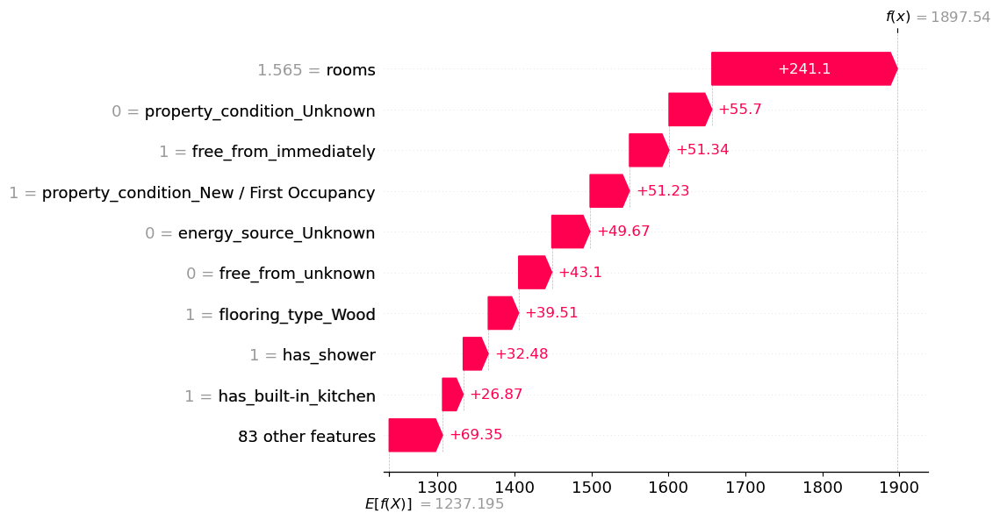

(1897.5404499999997, 321.1780324028815, (1412.176, 2349.0))

In [28]:
predict_with_confidence(raw_listing_1, saved_model, explainer=explainer, feature_names=feature_names)

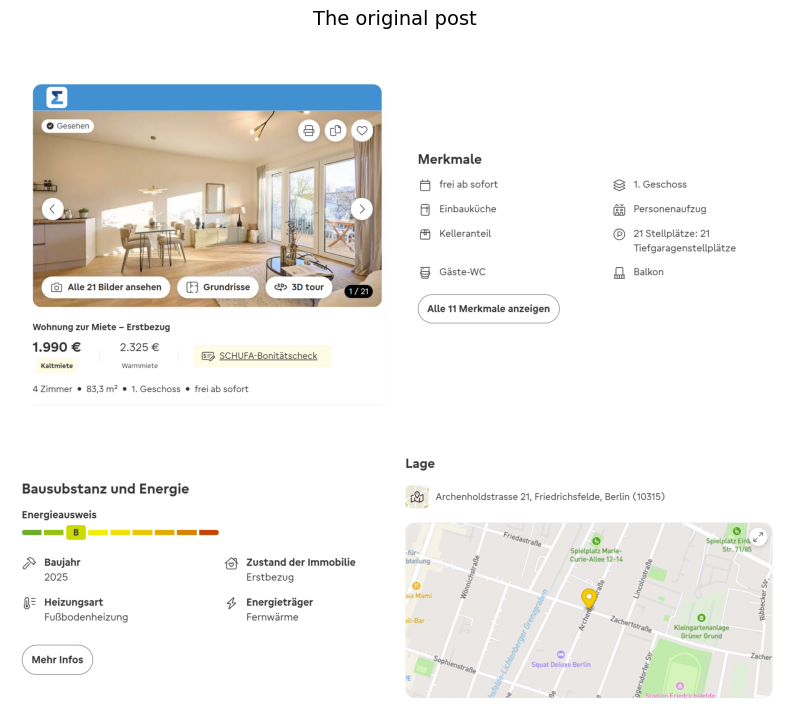

In [29]:
from PIL import Image

images = ["../images/1.png", "../images/2.png", "../images/3.png", "../images/4.png"]

fig, axes = plt.subplots(2, 2, figsize=(8, 8))

for ax, img_path in zip(axes.flatten(), images):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.axis("off")

fig.suptitle("The original post", fontsize=14)

plt.tight_layout()
plt.show()

<span style="font-weight:500">
We got an excellent prediction, very close to the original value (1990 euro).
</span>

In [30]:
raw_listing_2 = {
    "area": 87.8,
    "rooms": 3,
    "floor": 1,
    "free_from": "immediately",
    # "has_balkon": True,
    # "has_terrasse": True,
    # "has_garten": True,
    "elevator": True,
    # "parking": False,
    # "has_basement": True,
    # "is_barrier-free": True,
    "has_built-in_kitchen": True,
    # "has_bathtub": True,
    "has_shower": True,
    "flooring_type": "Vinyl",
    "energy_source": "Other",
    "heating_type": "Underfloor Heating",
    "property_condition": "New / First Occupancy",
    "year_built": 2025,
    "district": "Lichtenberg"
}

Predicted cold rent: €1793
Confidence (±1 std): €365  ->  ~68% range: €1428 - €2158
80% interval (tree p10-p90): €1310 - €2104


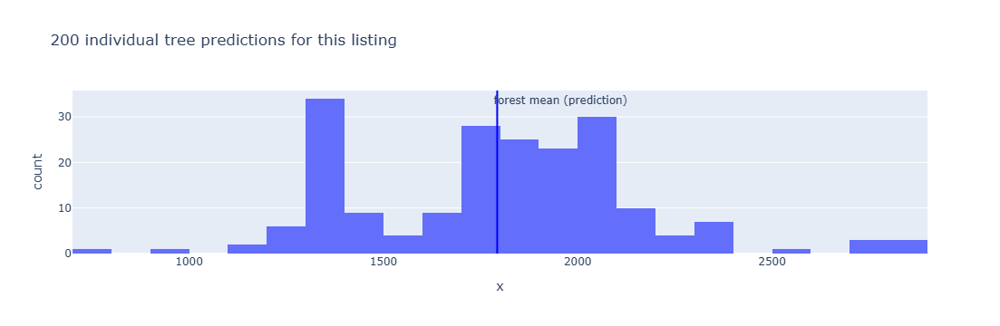

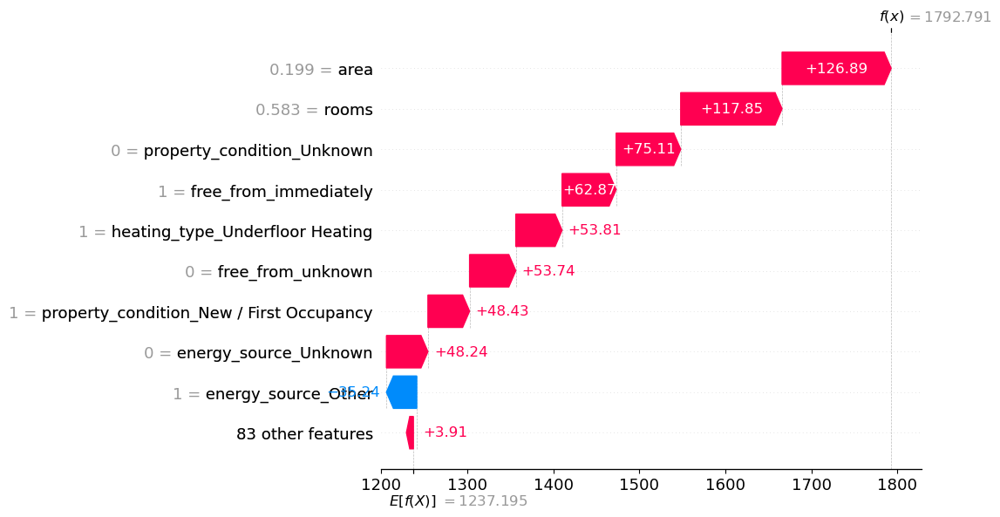

(1792.7910000000002, 364.76769268672905, (1309.77, 2104.4999999999995))

In [31]:
predict_with_confidence(raw_listing_2, saved_model, explainer=explainer, feature_names=feature_names)

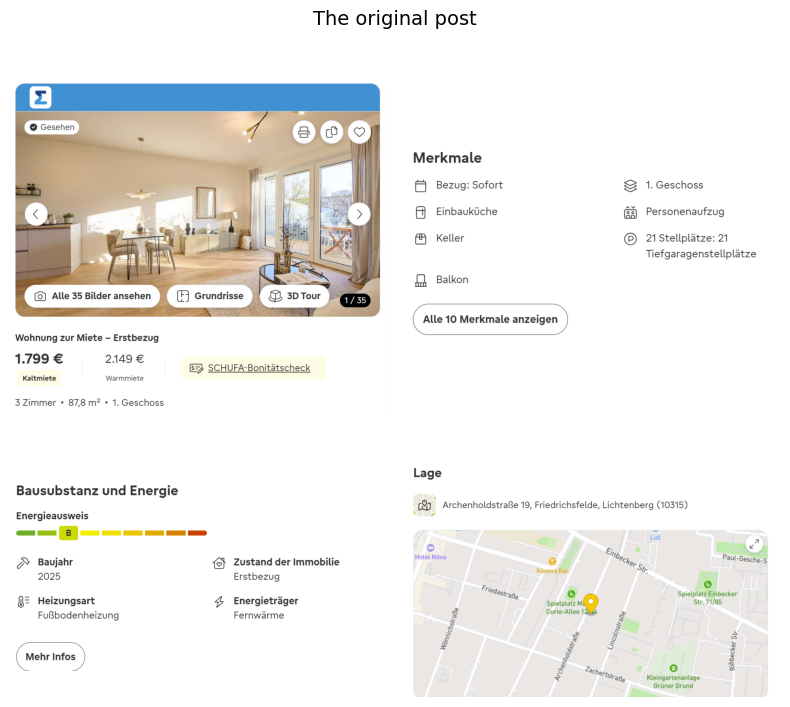

In [32]:
images = ["../images/5.png", "../images/6.png", "../images/7.png", "../images/8.png"]

fig, axes = plt.subplots(2, 2, figsize=(8, 8))

for ax, img_path in zip(axes.flatten(), images):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.axis("off")

fig.suptitle("The original post", fontsize=14)

plt.tight_layout()
plt.show()

<span style="font-weight:500">
We got another excellent prediction, with a predicted value of 1793 euro and an original price of 1799 euro. This shows us that the model is ready for inference and to be used by users.
</span>